In [6]:
from functools import partial

import jax
import jax.numpy as jnp
import optax

from utils import mcp_jnp

def poly(x: jnp.ndarray, w: jnp.ndarray):
    assert w.shape == (3,)
    w = w.astype(jnp.float32)
    return w[0] * x + w[1] * x**3 + w[2] * x**5


def poly_chain(x: jnp.ndarray, w_seq: jnp.ndarray):
    y = [x]
    for w in w_seq:
        y.append(poly(y[-1], w))
    return y


def min_of_polys(x: jnp.ndarray, w_seq: jnp.ndarray):
    y = jnp.full_like(x, jnp.inf)
    for w in w_seq:
        y = jnp.minimum(y, poly(x, w))
    return y


@partial(jax.jit, static_argnums=(2, 3))
def optimize_w(
    w_seq: jnp.ndarray,
    lr: float,
    n: int,
    debug: bool = False,
):
    def loss(w_seq: jnp.ndarray):
        w_seq = w_seq.astype(jnp.bfloat16)
        xs = (jnp.arange(2048) + 1) / 2048
        *zs, ys = jax.vmap(poly_chain, in_axes=(0, None))(xs, w_seq)
        # y_max = jnp.amax(ys)
        # y_min = jnp.amin(jnp.where(xs > 1 / 128, ys, jnp.inf))
        # diff_ratio = (y_max - y_min) / jnp.clip(y_max, min=1e-3)

        # slope_xs = (jnp.arange(320) + 1) / 256
        # min_ps = jax.vmap(min_of_polys, in_axes=(0, None))(slope_xs, w_seq)
        # min_slope = jnp.amin(min_ps / slope_xs)

        # z_max_seq = [jnp.amax(z) for z in zs]
        # max_next_excess = sum(
        #     jnp.clip(poly(z + 1 / 16, w) - z, min=0) for z, w in zip(z_max_seq, w_seq)
        # )
        target = mcp_jnp(ys)

        # obj_0 = ys[0] / y_max  # larger is better
        # obj_1 = y_max  # closer to 1 is better
        # obj_2 = jnp.log2(diff_ratio)  # smaller is better
        # obj_3 = min_slope  # larger is better
        # obj_4 = max_next_excess  # smaller is better
        obj = jnp.linalg.norm(ys-target)**2

        objectives = (obj)

        if debug:
            jax.debug.print("{x}", x=objectives)
        
        loss = obj
        # loss = -4.0 * obj_0
        # loss += 16.0 * jnp.square(obj_1 - 1)
        # loss += 2.0 * jnp.clip(obj_2, min=-10)
        # loss += -4.0 * jnp.clip(obj_3, max=1 / 2)
        # loss += 64.0 * obj_4
        return loss, objectives

    loss_and_grad_fn = jax.value_and_grad(loss, argnums=0, has_aux=True)
    optimizer = optax.chain(
        optax.adam(learning_rate=lr),
        optax.clip_by_global_norm(1.0),
    )
    opt_state = optimizer.init(w_seq)

    def body_fn(carry: tuple[jnp.ndarray, optax.OptState], _):
        w_seq, opt_state = carry
        (_, objectives), grad = loss_and_grad_fn(w_seq)
        updates, opt_state = optimizer.update(grad, opt_state)
        w_seq = optax.apply_updates(w_seq, updates)
        return (w_seq, opt_state), objectives

    (w_seq, _), objectives = jax.lax.scan(body_fn, (w_seq, opt_state), length=n)
    return w_seq, objectives


def main():
    BASE = 128
    w_seq = jnp.array([[3.5, -6.04444444444, 2.84444444444]] * 6)
    for i in range(5):
        w_seq, objectives = optimize_w(w_seq, lr=2e-3, n=100_000)
        print(w_seq.astype(jnp.bfloat16) * BASE)
        print(w_seq)
        print(i, [obj.item() for obj in objectives])
    # for i in range(5):
    #     w_seq, objectives = optimize_w(w_seq, lr=1e-3, n=100000)
    #     print(w_seq.astype(jnp.bfloat16) * BASE)
    #     print(i, [obj[-1].item() for obj in objectives])
    # for i in range(5):
    #     w_seq, objectives = optimize_w(w_seq, lr=5e-4, n=100000)
    #     print(w_seq.astype(jnp.bfloat16) * BASE)
    #     print(i, [obj[-1].item() for obj in objectives])
    # for i in range(20):
    #     w_seq, objectives = optimize_w(w_seq, lr=1e-4, n=100000)
    #     print(w_seq.astype(jnp.bfloat16) * BASE)
    #     print(i, [obj[-1].item() for obj in objectives])
    return w_seq


w_seq = main()

[[496 -772 328]
 [460 -780 358]
 [468 -780 358]
 [456 -788 368]
 [428 -784 356]
 [-24832 -732 450]]
[[   3.8759515   -6.042955     2.566441 ]
 [   3.5860448   -6.102192     2.8014078]
 [   3.6630366   -6.10868      2.7895315]
 [   3.5687692   -6.150101     2.8676896]
 [   3.3514588   -6.1399903    2.775053 ]
 [-193.88457     -5.7099977    3.521794 ]]
0 [991.0773315429688, 991.0773315429688, 877.3231201171875, 877.3231201171875, 716.7911376953125, 707.4856567382812, 707.4856567382812, 653.45751953125, 653.45751953125, 653.45751953125, 653.45751953125, 653.45751953125, 539.0157470703125, 528.0398559570312, 522.3089599609375, 522.3089599609375, 521.8873901367188, 419.3671875, 401.7309875488281, 401.7309875488281, 305.9293212890625, 316.1822814941406, 316.1822814941406, 314.8098449707031, 301.7374572753906, 283.9949035644531, 283.9949035644531, 240.8784942626953, 211.16136169433594, 212.07534790039062, 205.8082275390625, 197.81280517578125, 194.34951782226562, 142.4647979736328, 142.464797

In [7]:
w_seq

Array([[   3.8759515,   -6.042955 ,    2.566441 ],
       [   3.5860448,   -6.102192 ,    2.8014078],
       [   3.6630366,   -6.10868  ,    2.7895315],
       [   3.5687692,   -6.150101 ,    2.8676896],
       [   3.3514588,   -6.1399903,    2.775053 ],
       [-999.07446  ,   -5.7099977,    3.521794 ]], dtype=float32)

In [8]:
def NewtonSchulz_MCP(M, w_seq = None):
   # by @YouJiacheng (with stability loss idea from @leloykun)
   # https://twitter.com/YouJiacheng/status/1893704552689303901
   # https://gist.github.com/YouJiacheng/393c90cbdc23b09d5688815ba382288b/5bff1f7781cf7d062a155eecd2f13075756482ae

    #TODO
    if w_seq is None:
        abc_list = [
            (3955/1024, -8306/1024, 5008/1024),
            (3735/1024, -6681/1024, 3463/1024),
            (3799/1024, -6499/1024, 3211/1024),
            (4019/1024, -6385/1024, 2906/1024),
            (2677/1024, -3029/1024, 1162/1024),
            (2172/1024, -1833/1024,  682/1024)
        ]
    else:
        abc_list = w_seq
    transpose = M.shape[1] > M.shape[0]
    if transpose:
        M = M.T
    M = M / np.linalg.norm(M)
    for a, b, c in abc_list:
        A = M.T @ M
        I = np.eye(A.shape[0])
        M = M @ (a * I + b * A + c * A @ A)
    if transpose:
        M = M.T
    return M

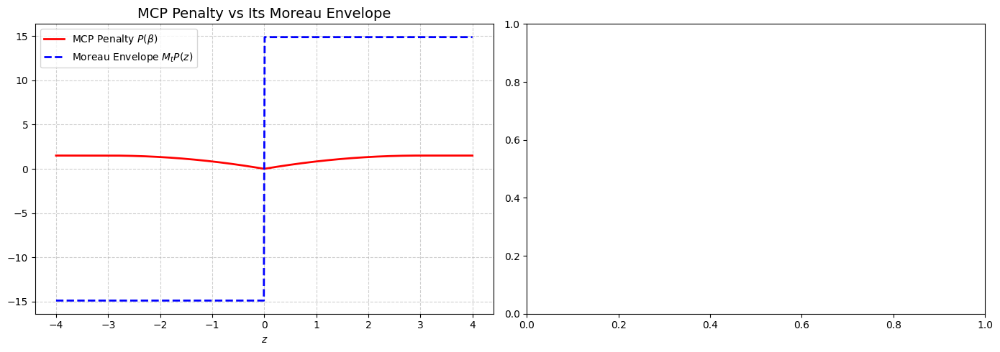

In [22]:
from utils import mcp
import numpy as np
import matplotlib.pyplot as plt
# Parameters
t = 1000**(-1/4)

z = np.linspace(-4, 4, 500)

# Compute functions
mcp_vals = mcp(z)
moreau_vals = [NewtonSchulz_MCP(np.array([[zi]]), w_seq)[0, 0] for zi in z]
# grad_moreau = (z - prox_mcp_t(z, lam, gamma, t)) / t  # ∇M_t P(z)

# Plot
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

# Left: MCP vs Moreau envelope
axs[0].plot(z, mcp_vals, 'r-', linewidth=2, label='MCP Penalty $P(\\beta)$')
axs[0].plot(z, moreau_vals, 'b--', linewidth=2, label='Moreau Envelope $M_t P(z)$')
axs[0].set_title('MCP Penalty vs Its Moreau Envelope', fontsize=14)
axs[0].set_xlabel('$z$')
axs[0].legend()
axs[0].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()